# Spatial Data

In [26]:
!pip -q install scanpy anndata leidenalg louvain igraph gdown tqdm pillow requests

In [27]:
import os, re, json, zipfile, shutil
from pathlib import Path
from IPython.display import Image, display

import numpy as np
import pandas as pd
import scanpy as sc

from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from tqdm.auto import tqdm

import matplotlib.pyplot as plt

sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi=120)

# Data loader

In [28]:
GDRIVE_FOLDER_URL = "https://drive.google.com/drive/folders/1Lz3_Bjct5pwf50Zrkt-uONNNdDFT182R?usp=sharing"
OUT_ROOT = Path("data")
OUT_ROOT.mkdir(parents=True, exist_ok=True)

# gdown folder download
!gdown --folder "{GDRIVE_FOLDER_URL}" -O "data/gdrive_visium"
print("Downloaded to:", (OUT_ROOT/"gdrive_visium").resolve())

Retrieving folder contents
Retrieving folder 12BCDSgcPAw5SrdvrZykbSYziZbvOjzB- spatial
Processing file 15ZIFmk2WIo6DeR0y8wxs6ycMxo3u9mUW scalefactors_json.json
Processing file 1u4jtpfB8Oz0yLuACIBNaC-MzActIR5RX tissue_hires_image.png
Processing file 14qqXtJWNIfQDer2ohRc8p5SKW0-TtPC2 tissue_lowres_image.png
Processing file 1yWTtYw1JxYGExJuBDR_V0nkHS825gNyi tissue_positions_list.csv
Processing file 1brdMBSr8QQq_orip4Tx9Vr1EyLm4Se9v 151671_visium_processed.h5ad
Processing file 1NcXrJGPY6vSaOVEHtFR_2CUwsj_TwhSF filtered_feature_bc_matrix.h5
Processing file 1NrfEN85vmnOM4--lO2YmiRrrpv7Tcg_h metadata.tsv
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=15ZIFmk2WIo6DeR0y8wxs6ycMxo3u9mUW
To: /content/data/gdrive_visium/spatial/scalefactors_json.json
100% 162/162 [00:00<00:00, 560kB/s]
Downloading...
From: https://drive.google.com/uc?id=1u4jtpfB8Oz0yLuACIBNaC-MzActIR5RX
To: /content/data/g

#flagship data

In [29]:
# =========================
# Figshare public API download helpers
# =========================
import requests

def figshare_get_json(url: str):
    r = requests.get(url, timeout=60)
    r.raise_for_status()
    return r.json()

def figshare_list_files(article_id: int):
    # Public article endpoint
    url = f"https://api.figshare.com/v2/articles/{article_id}"
    info = figshare_get_json(url)
    if "files" in info and len(info["files"]) > 0:
        return info["files"]
    # Fallback endpoint
    url2 = f"https://api.figshare.com/v2/articles/{article_id}/files"
    return figshare_get_json(url2)

def download_url_to_path(url: str, out_path: Path, chunk_size=1<<20):
    out_path.parent.mkdir(parents=True, exist_ok=True)
    with requests.get(url, stream=True, timeout=120) as r:
        r.raise_for_status()
        total = int(r.headers.get("Content-Length", 0))
        with open(out_path, "wb") as f:
            if total > 0:
                pbar = tqdm(total=total, unit="B", unit_scale=True, desc=out_path.name)
            else:
                pbar = None
            for chunk in r.iter_content(chunk_size=chunk_size):
                if chunk:
                    f.write(chunk)
                    if pbar: pbar.update(len(chunk))
            if pbar: pbar.close()

def unzip_if_needed(path: Path, out_dir: Path):
    if path.suffix.lower() != ".zip":
        return
    out_dir.mkdir(parents=True, exist_ok=True)
    with zipfile.ZipFile(path, "r") as z:
        z.extractall(out_dir)

FIGSHARE_ARTICLE_ID = 28200299
FIGSHARE_DIR = OUT_ROOT / "figshare_10x_visium"
FIGSHARE_DIR.mkdir(parents=True, exist_ok=True)

files = figshare_list_files(FIGSHARE_ARTICLE_ID)
print("Figshare files:", len(files))
for f in files:
    name = f.get("name", "unknown")
    durl = f.get("download_url", None)
    if not durl:
        continue
    out_path = FIGSHARE_DIR / name
    if out_path.exists() and out_path.stat().st_size > 0:
        continue
    download_url_to_path(durl, out_path)

# unzip all zips into a folder (keeps originals too)
UNZIPPED_DIR = FIGSHARE_DIR / "_unzipped"
UNZIPPED_DIR.mkdir(parents=True, exist_ok=True)
for z in FIGSHARE_DIR.glob("*.zip"):
    unzip_if_needed(z, UNZIPPED_DIR)

print("Figshare downloaded at:", FIGSHARE_DIR.resolve())
print("Unzipped at:", UNZIPPED_DIR.resolve())


Figshare files: 103
Figshare downloaded at: /content/data/figshare_10x_visium
Unzipped at: /content/data/figshare_10x_visium/_unzipped


# Task 1: Read Visium Data

## Robust loader for a Visium sample folder

In [30]:
def find_visium_outs_dirs(root: Path):
    """Find candidate Visium 'outs' directories containing filtered_feature_bc_matrix.h5 + spatial/."""
    root = Path(root)
    candidates = []
    for h5 in root.rglob("filtered_feature_bc_matrix.h5"):
        outs = h5.parent
        if (outs / "spatial").exists():
            candidates.append(outs)
    # Also support other names sometimes used
    for h5 in root.rglob("*feature_bc_matrix.h5"):
        outs = h5.parent
        if (outs / "spatial").exists():
            candidates.append(outs)
    # unique
    uniq = []
    seen = set()
    for c in candidates:
        s = str(c.resolve())
        if s not in seen:
            seen.add(s)
            uniq.append(c)
    return uniq

def locate_metadata_near(visium_outs: Path):
    """Try to locate metadata.tsv near the outs folder."""
    visium_outs = Path(visium_outs)
    checks = [
        visium_outs / "metadata.tsv",
        visium_outs.parent / "metadata.tsv",
        visium_outs.parent.parent / "metadata.tsv",
    ]
    for p in checks:
        if p.exists():
            return p
    hits = list(visium_outs.parent.rglob("metadata.tsv"))
    return hits[0] if hits else None

def read_visium_with_gt(visium_outs: Path, metadata_path: Path | None = None, gt_col="layer_guess_reordered"):
    visium_outs = Path(visium_outs)
    if metadata_path is None:
        metadata_path = locate_metadata_near(visium_outs)

    # Read Visium
    adata = sc.read_visium(
        path=str(visium_outs),
        count_file="filtered_feature_bc_matrix.h5",
        load_images=True
    )
    adata.var_names_make_unique()

    # Attach GT
    if metadata_path is None or (not Path(metadata_path).exists()):
        print("WARNING: metadata.tsv not found; returning AnnData without GT.")
        return adata

    meta = pd.read_csv(metadata_path, sep="\t")
    # pick barcode column or index
    if "barcode" in meta.columns:
        meta = meta.set_index("barcode")
    else:
        # sometimes first column is barcode but unnamed
        if meta.columns[0].lower().startswith("unnamed"):
            meta = meta.set_index(meta.columns[0])

    meta.index = meta.index.astype(str)

    # Harmonize barcode suffix "-1" if needed
    obs_idx = adata.obs_names.astype(str)
    if meta.index.isin(obs_idx).sum() == 0:
        meta2 = meta.copy()
        meta2.index = meta2.index + "-1"
        if meta2.index.isin(obs_idx).sum() > 0:
            meta = meta2

    # Join
    adata.obs = adata.obs.join(meta, how="left")
    missing = adata.obs[gt_col].isna().mean() if gt_col in adata.obs.columns else 1.0
    print(f"GT join: missing-rate for '{gt_col}' = {missing:.3f}")
    if gt_col in adata.obs.columns:
        adata.obs[gt_col] = adata.obs[gt_col].astype("category")

    return adata

## Google Drive sample (151671) and saving h5ad

In [31]:
# Point to the gdrive sample folder
gdrive_root = OUT_ROOT / "gdrive_visium"
cands = find_visium_outs_dirs(gdrive_root)
print("Found candidates:", len(cands))
for i,c in enumerate(cands[:10]):
    print(i, c)

# Pick the one under visium_sample (usually only one)
visium_outs_151671 = [c for c in cands if "visium_sample" in str(c)][0] if any("visium_sample" in str(c) for c in cands) else cands[0]
adata_151671 = read_visium_with_gt(visium_outs_151671)

# Save
OUT_H5AD = OUT_ROOT / "151671_raw_with_gt.h5ad"
adata_151671.write_h5ad(OUT_H5AD)
print("Saved:", OUT_H5AD.resolve())

Found candidates: 1
0 data/gdrive_visium
reading data/gdrive_visium/filtered_feature_bc_matrix.h5


/tmp/ipython-input-355088279.py:44: FutureWarning: Use `squidpy.read.visium` instead.
  adata = sc.read_visium(
/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:02)


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


GT join: missing-rate for 'layer_guess_reordered' = 0.004
Saved: /content/data/151671_raw_with_gt.h5ad


In [32]:
# Sanity check- Locating processed file from gdrive sample
proc_hits = list(gdrive_root.rglob("*_visium_processed.h5ad"))
print("Processed hits:", proc_hits)

if proc_hits:
    ad_proc = sc.read_h5ad(proc_hits[0])
    common = adata_151671.obs_names.intersection(ad_proc.obs_names)
    col = "layer_guess_reordered"
    if col in adata_151671.obs.columns and col in ad_proc.obs.columns and len(common) > 0:
        agree = (adata_151671.obs.loc[common, col].astype(str) == ad_proc.obs.loc[common, col].astype(str)).mean()
        print("GT agreement on common barcodes:", agree)
        print("Your GT counts:\n", adata_151671.obs[col].value_counts())
        print("Proc GT counts:\n", ad_proc.obs[col].value_counts())

Processed hits: [PosixPath('data/gdrive_visium/151671_visium_processed.h5ad')]


# Task 2: Perform Clustering and visualize

In [33]:
def compute_metrics(true_labels, pred_labels):
    m = (~pd.isna(true_labels)) & (~pd.isna(pred_labels))
    y = pd.Series(true_labels[m]).astype(str).values
    p = pd.Series(pred_labels[m]).astype(str).values
    ari = adjusted_rand_score(y, p)
    nmi = normalized_mutual_info_score(y, p, average_method="arithmetic")
    return ari, nmi

def run_leiden_pipeline(
    adata_in: sc.AnnData,
    gt_col="layer_guess_reordered",
    mode="pca",          # "pca" or "hvg"
    n_hvg=2000,
    key_added="leiden",
    resolution=0.8,
    n_pcs=30,
    seed=0,
):
    ad = adata_in.copy()

    # Basic preprocessing
    sc.pp.filter_genes(ad, min_counts=1)
    sc.pp.normalize_total(ad, target_sum=1e4)
    sc.pp.log1p(ad)

    # Feature choice
    if mode == "hvg":
        sc.pp.highly_variable_genes(ad, flavor="seurat", n_top_genes=int(n_hvg))
        ad = ad[:, ad.var["highly_variable"]].copy()

    sc.pp.scale(ad, max_value=10)
    sc.tl.pca(ad, svd_solver="arpack")

    sc.pp.neighbors(ad, n_neighbors=15, n_pcs=int(n_pcs), random_state=seed)
    sc.tl.leiden(ad, resolution=float(resolution), key_added=key_added, random_state=seed)

    # Metrics
    if gt_col in ad.obs.columns:
        ari, nmi = compute_metrics(ad.obs[gt_col], ad.obs[key_added])
    else:
        ari, nmi = np.nan, np.nan

    return ad, ari, nmi


def visium_library_id(adata):
    if "spatial" in adata.uns and isinstance(adata.uns["spatial"], dict) and len(adata.uns["spatial"]) > 0:
        return list(adata.uns["spatial"].keys())[0]
    return None

def save_spatial_plot(adata, color, out_png, title="", spot_size=None, show_img=True, dpi=200):
    out_png = Path(out_png)
    out_png.parent.mkdir(parents=True, exist_ok=True)

    lib_id = visium_library_id(adata)

    # Make the plot but DON'T show yet
    sc.pl.spatial(
        adata,
        color=color,
        img_key="hires",
        library_id=lib_id,
        title=title,
        spot_size=spot_size,
        show=False
    )

    # Save
    plt.savefig(out_png, bbox_inches="tight", dpi=dpi)

    # Show in Colab output
    if show_img:
        display(Image(filename=str(out_png)))

    plt.close()

filtered out 11907 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:01:21)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:02)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


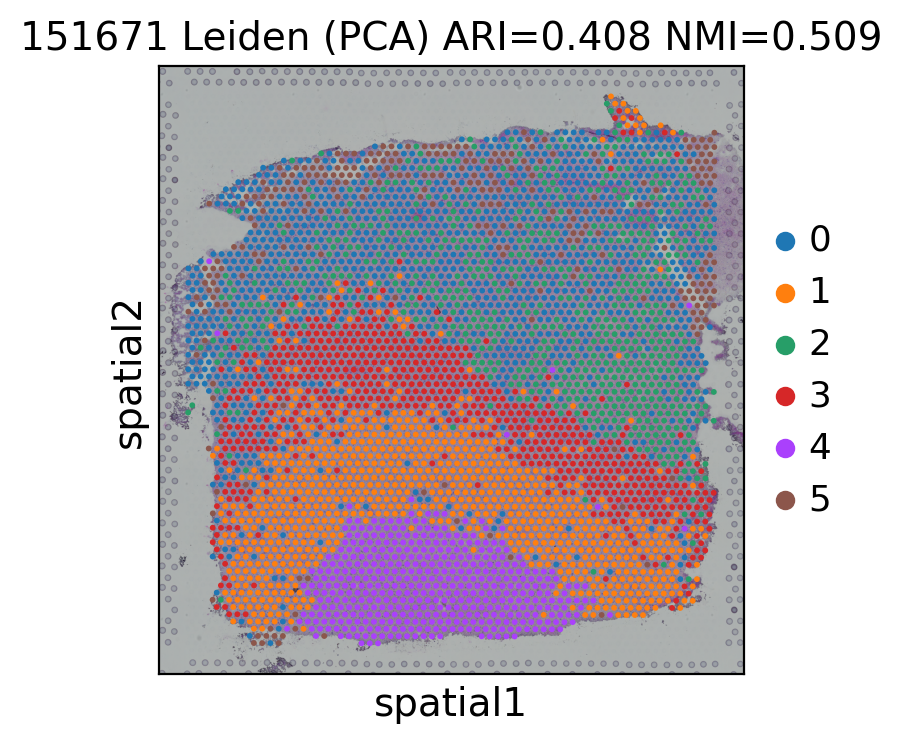

filtered out 11907 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:03)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


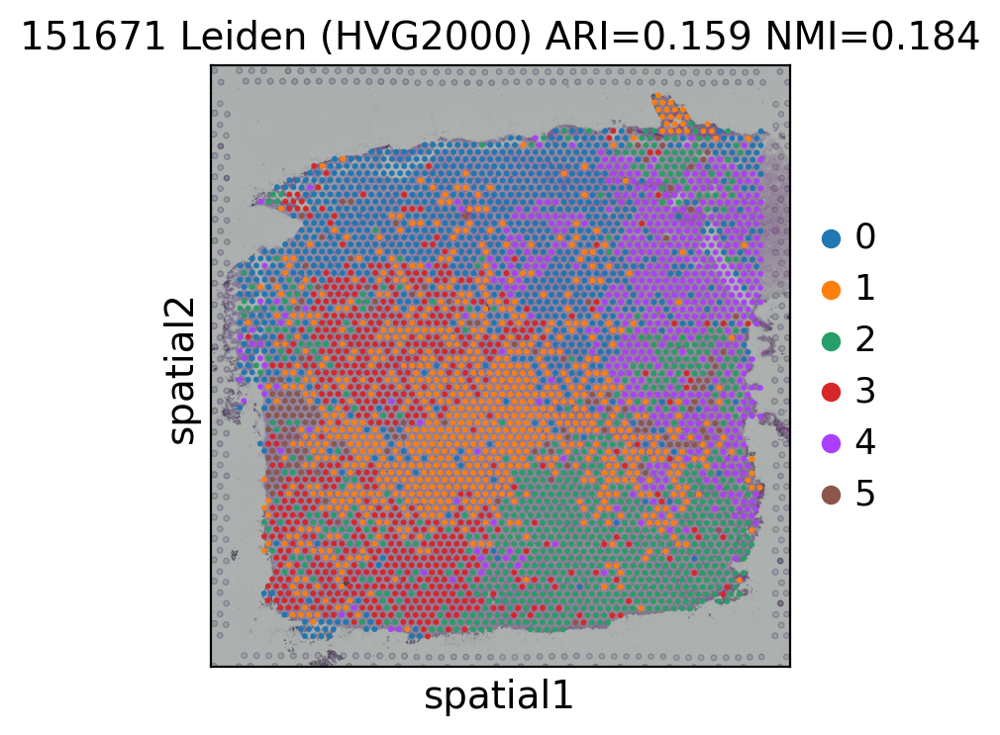

filtered out 11907 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:14)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:03)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


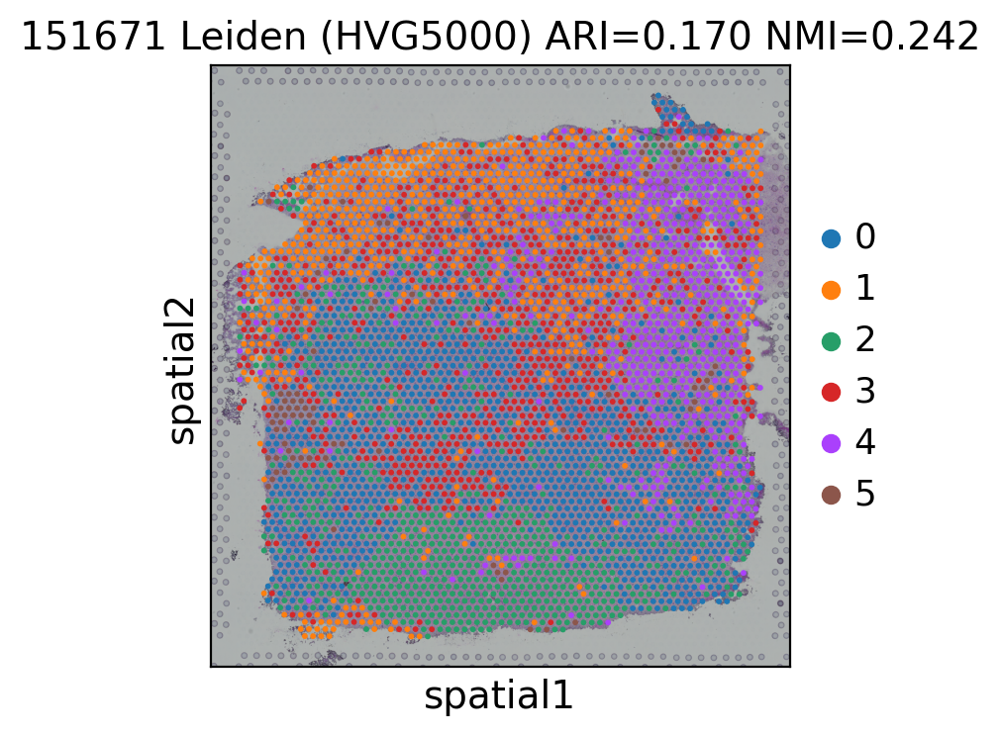

{'PCA': (0.40788744579604014, np.float64(0.5086599277920641)),
 'HVG2000': (0.15895344447997614, np.float64(0.18413882747202445)),
 'HVG5000': (0.16998836622520383, np.float64(0.24172956168524415))}

In [34]:
FIG_DIR = Path("figures")
FIG_DIR.mkdir(exist_ok=True)

results_151671 = {}

# (A) PCA only
ad_pca, ari_pca, nmi_pca = run_leiden_pipeline(
    adata_151671, mode="pca", key_added="leiden_pca", resolution=0.8, n_pcs=30
)
save_spatial_plot(ad_pca, "leiden_pca", FIG_DIR/"151671_leiden_PCA.png", title=f"151671 Leiden (PCA) ARI={ari_pca:.3f} NMI={nmi_pca:.3f}")
results_151671["PCA"] = (ari_pca, nmi_pca)

# (B) HVG 2000
ad_2k, ari_2k, nmi_2k = run_leiden_pipeline(
    adata_151671, mode="hvg", n_hvg=2000, key_added="leiden_2k", resolution=0.8, n_pcs=30
)
save_spatial_plot(ad_2k, "leiden_2k", FIG_DIR/"151671_leiden_HVG2000.png", title=f"151671 Leiden (HVG2000) ARI={ari_2k:.3f} NMI={nmi_2k:.3f}")
results_151671["HVG2000"] = (ari_2k, nmi_2k)

# (C) HVG 5000
ad_5k, ari_5k, nmi_5k = run_leiden_pipeline(
    adata_151671, mode="hvg", n_hvg=5000, key_added="leiden_5k", resolution=0.8, n_pcs=30
)
save_spatial_plot(ad_5k, "leiden_5k", FIG_DIR/"151671_leiden_HVG5000.png", title=f"151671 Leiden (HVG5000) ARI={ari_5k:.3f} NMI={nmi_5k:.3f}")
results_151671["HVG5000"] = (ari_5k, nmi_5k)

results_151671

# Task 3: Filling up the following table

In [43]:
import requests, re
article_id = 28200299
files = requests.get(f"https://api.figshare.com/v2/articles/{article_id}").json().get("files", [])
names = [f["name"] for f in files]
print("Has 151510 matrix in figshare listing?",
      any(re.search(r"151510.*filtered_feature_bc_matrix\.h5", n) for n in names))
# show near matches
[x for x in names if "151510" in x][:20]

Has 151510 matrix in figshare listing? False


['151510_full_image.tif']

filtered out 11907 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:01:19)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:02)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


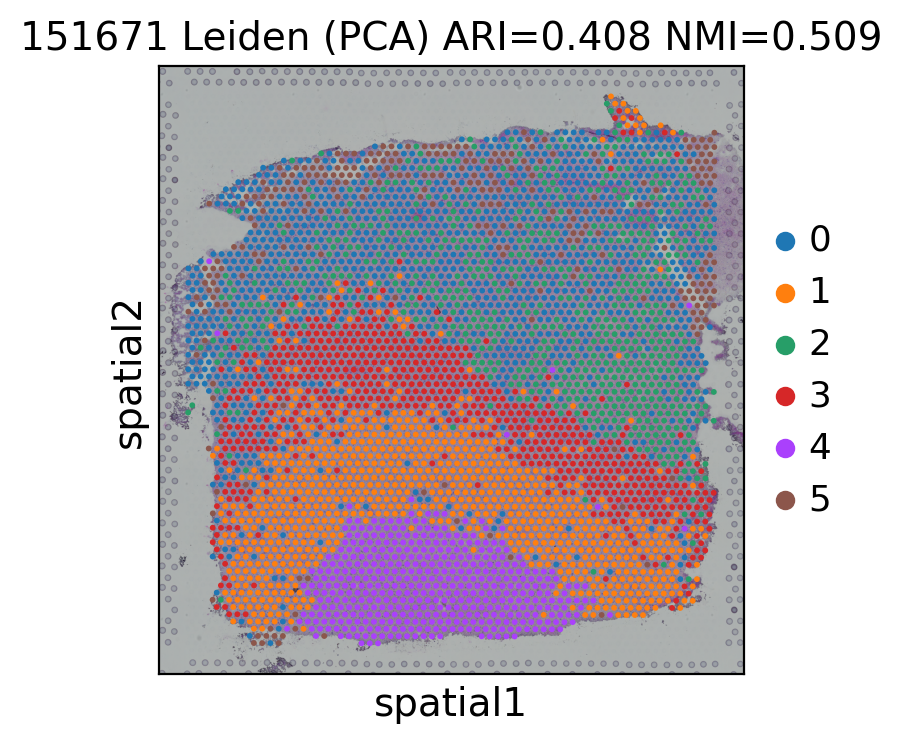

filtered out 11907 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
computing PCA
    with n_comps=50


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:03)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


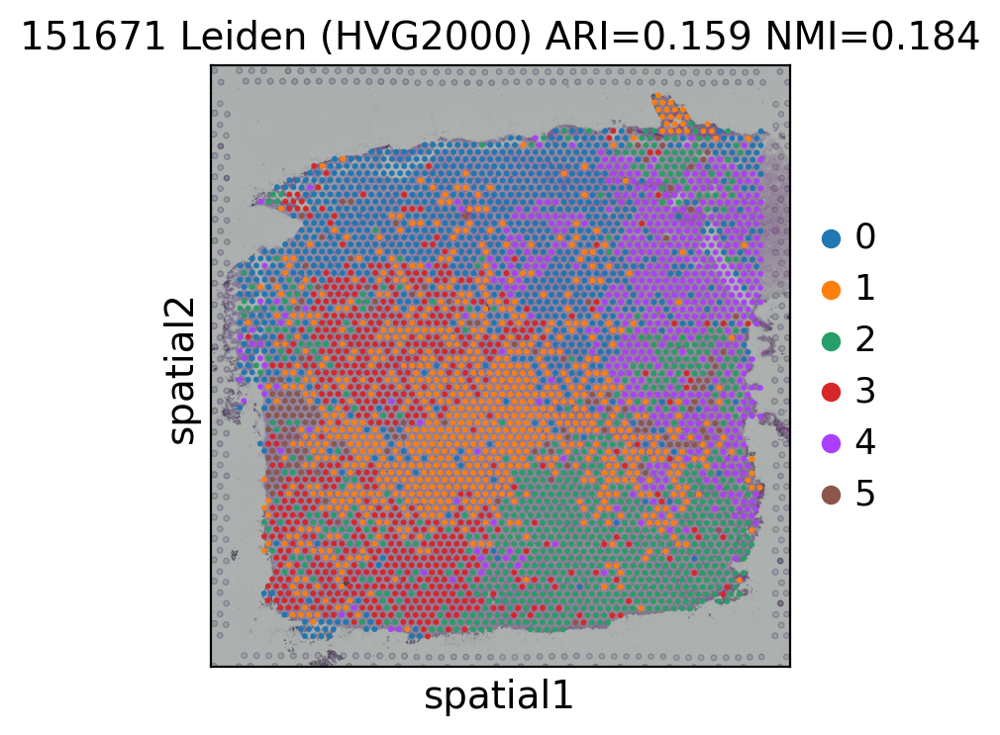

filtered out 11907 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:13)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:04)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


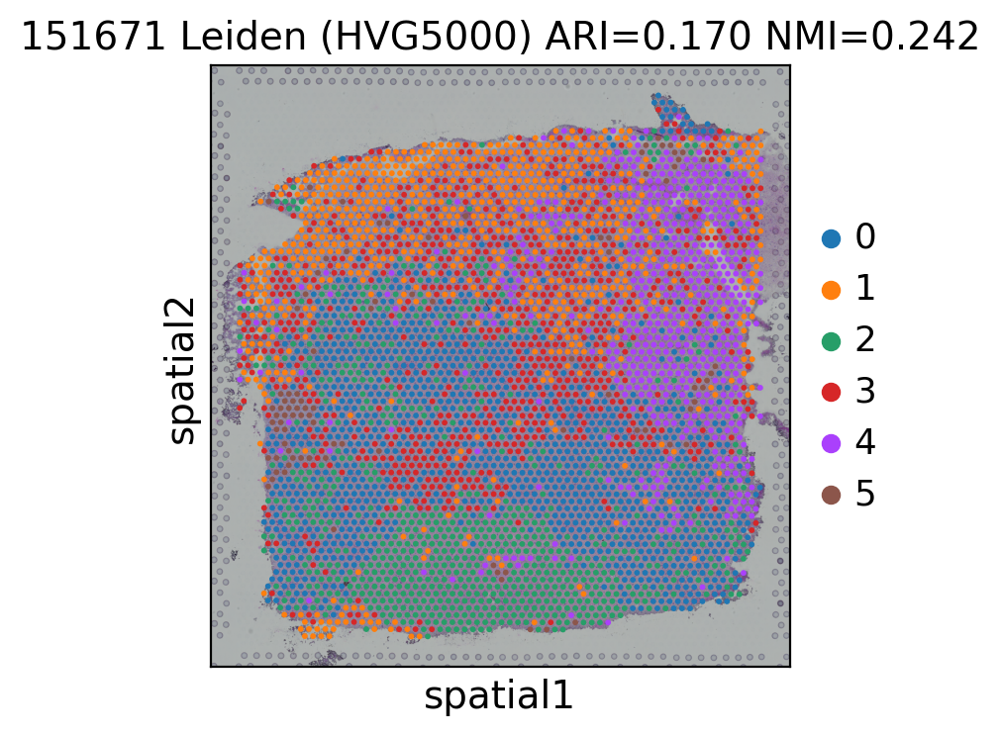

reading data/figshare_prepared_outs/151507/filtered_feature_bc_matrix.h5


/tmp/ipython-input-981287957.py:3: FutureWarning: Use `squidpy.read.visium` instead.
  adata = sc.read_visium(str(outs_dir), count_file="filtered_feature_bc_matrix.h5", load_images=True)


 (0:00:00)


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


GT missing rate: 0.22030288689067676
filtered out 12387 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:01:13)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:04)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


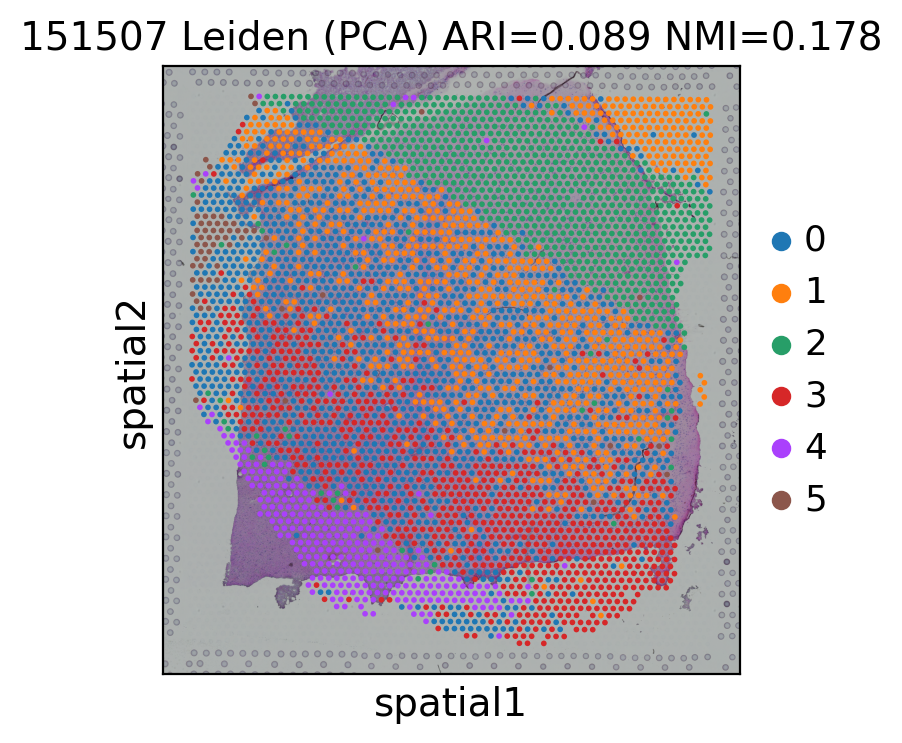

filtered out 12387 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
computing PCA
    with n_comps=50


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:05)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


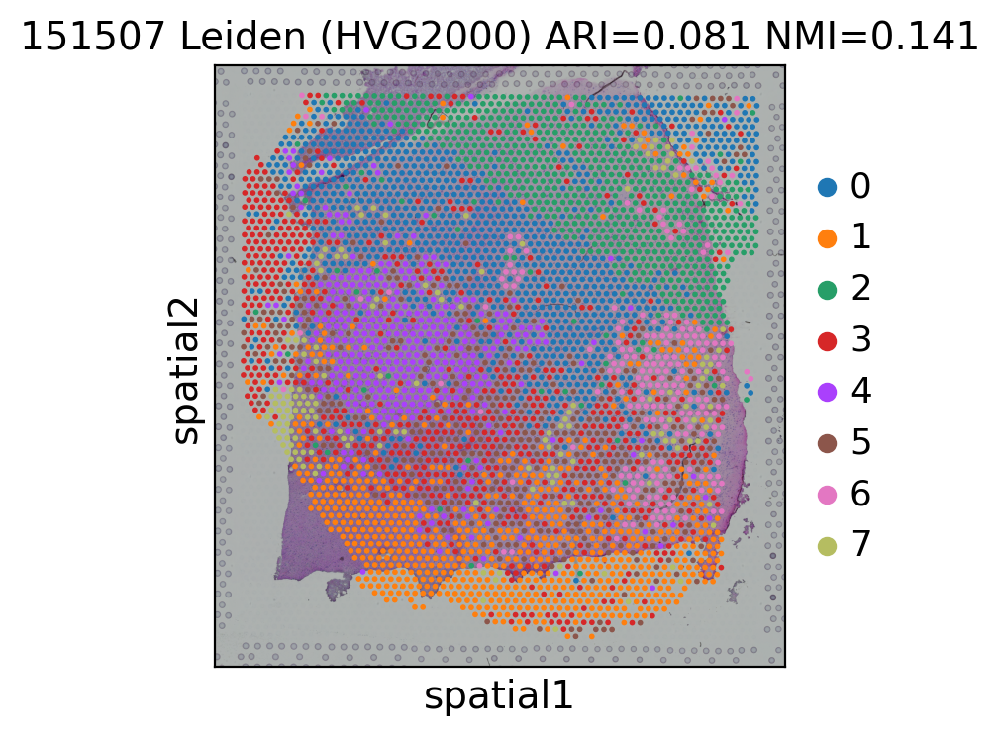

filtered out 12387 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
computing PCA
    with n_comps=50


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


    finished (0:00:15)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:04)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


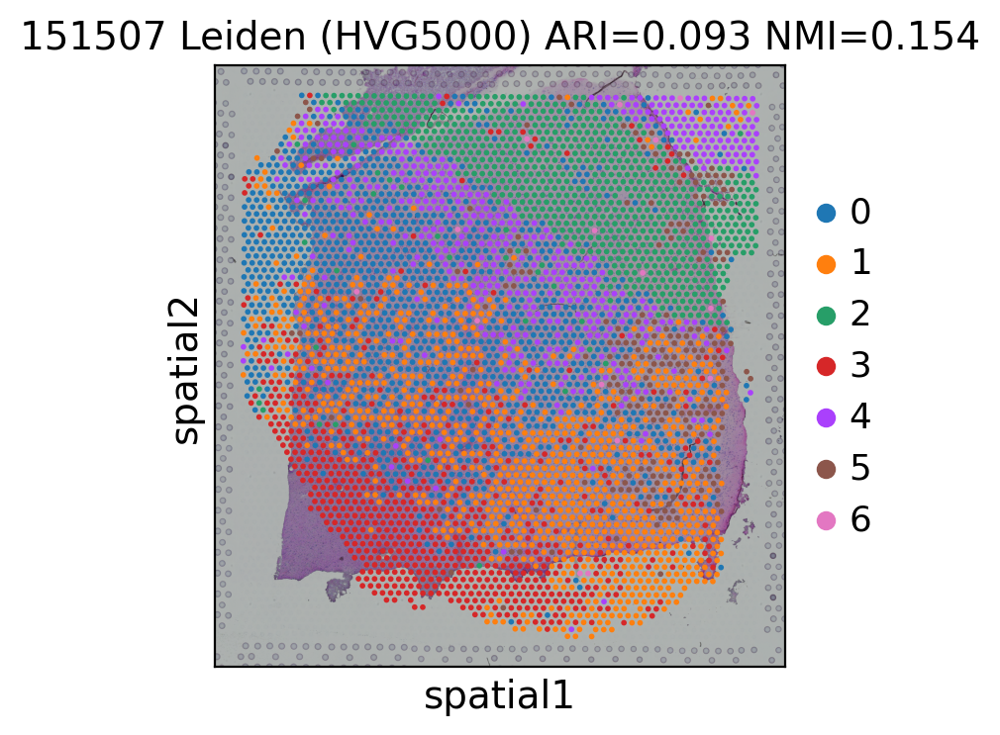

reading data/figshare_prepared_outs/151508/filtered_feature_bc_matrix.h5


/tmp/ipython-input-981287957.py:3: FutureWarning: Use `squidpy.read.visium` instead.
  adata = sc.read_visium(str(outs_dir), count_file="filtered_feature_bc_matrix.h5", load_images=True)


 (0:00:00)


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


GT missing rate: 0.23905109489051096
filtered out 12801 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:01:21)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:03)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


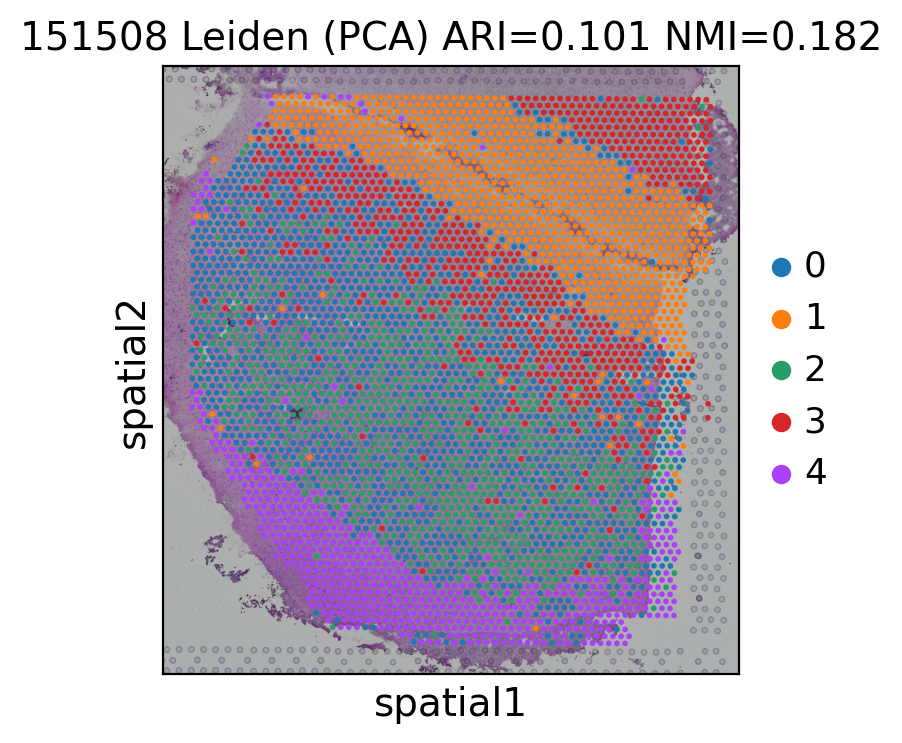

filtered out 12801 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
computing PCA
    with n_comps=50


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:05)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


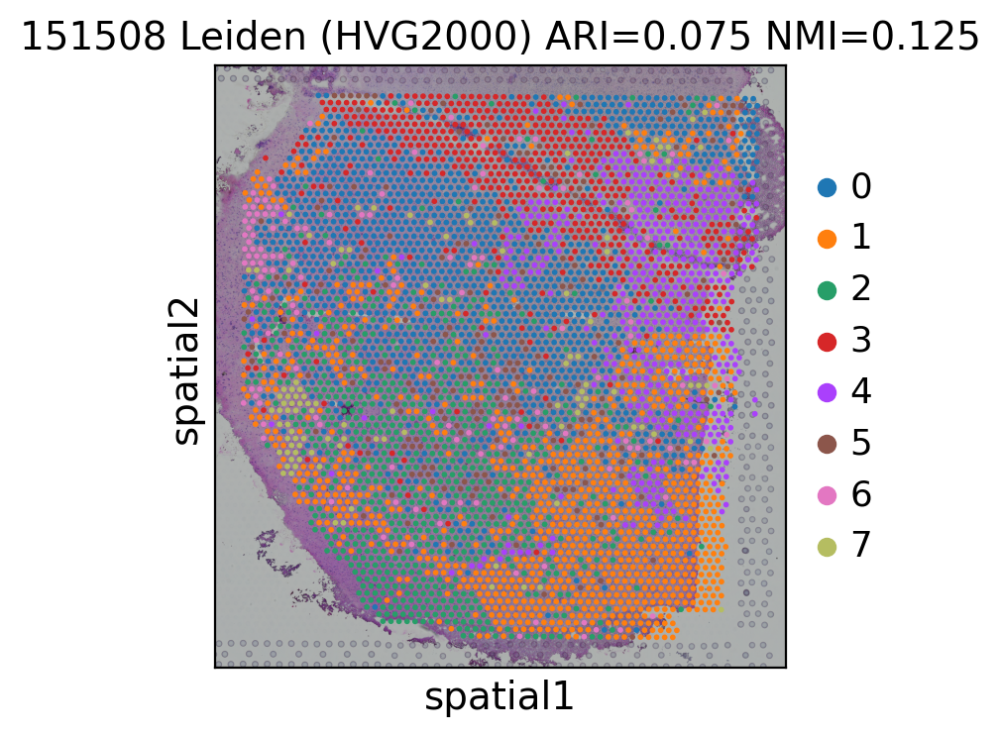

filtered out 12801 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:16)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:06)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


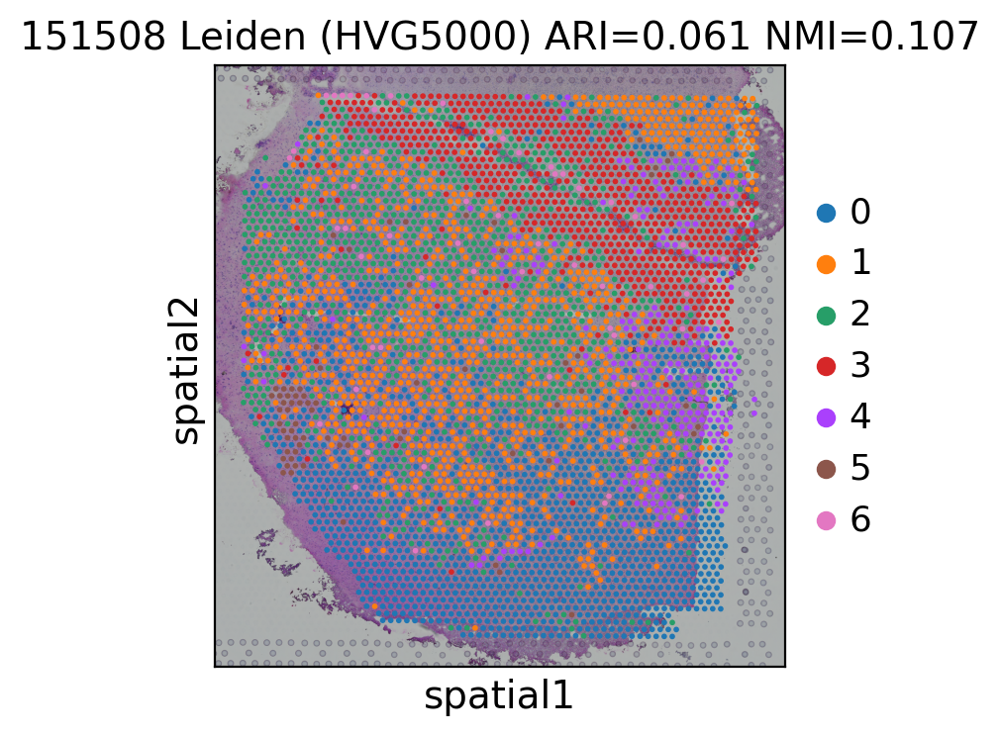

reading data/figshare_prepared_outs/151509/filtered_feature_bc_matrix.h5


/tmp/ipython-input-981287957.py:3: FutureWarning: Use `squidpy.read.visium` instead.
  adata = sc.read_visium(str(outs_dir), count_file="filtered_feature_bc_matrix.h5", load_images=True)


 (0:00:00)


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


GT missing rate: 0.2837753184380873
filtered out 12259 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:01:34)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:04)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


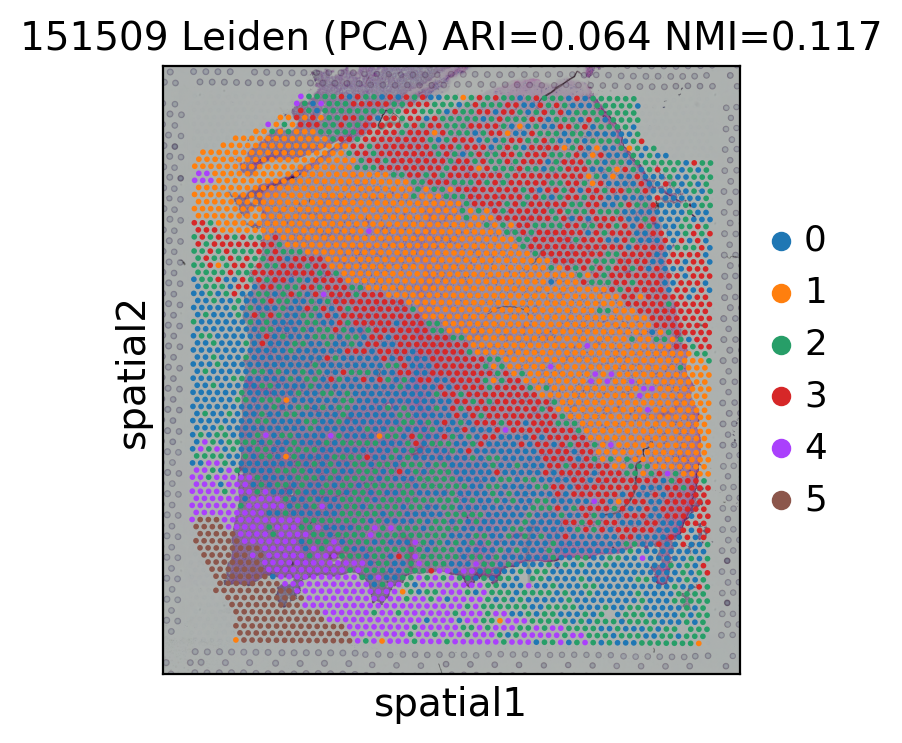

filtered out 12259 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
computing PCA
    with n_comps=50


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:04)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


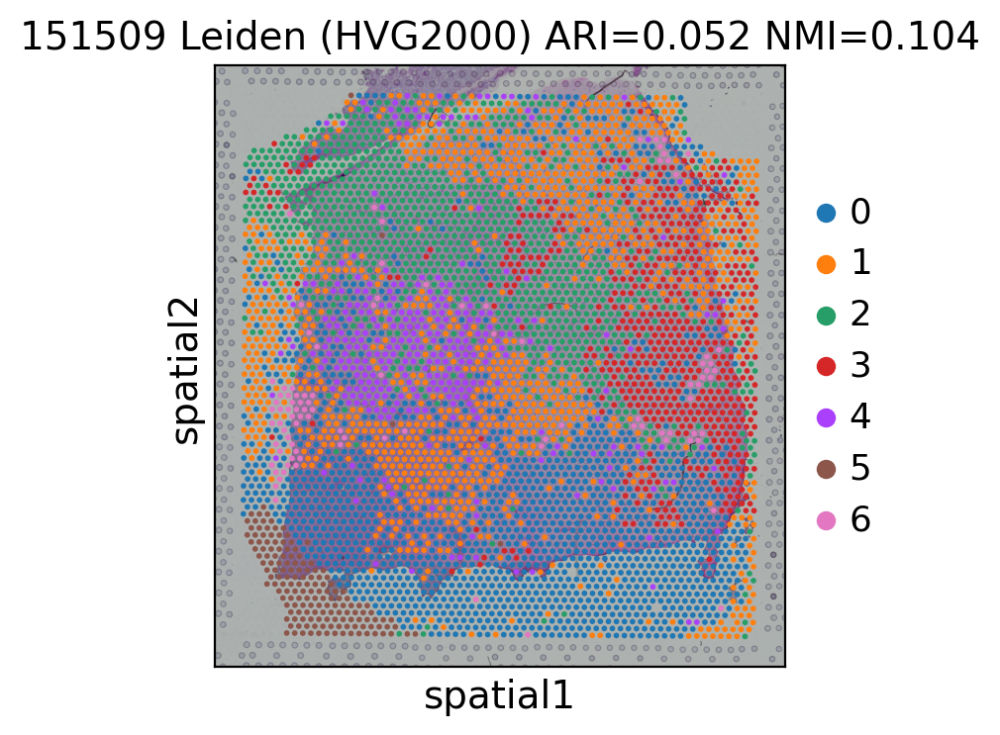

filtered out 12259 genes that are detected in less than 1 counts
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)


/usr/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:20)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:00)
running Leiden clustering
    finished (0:00:08)


/tmp/ipython-input-2270725815.py:58: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


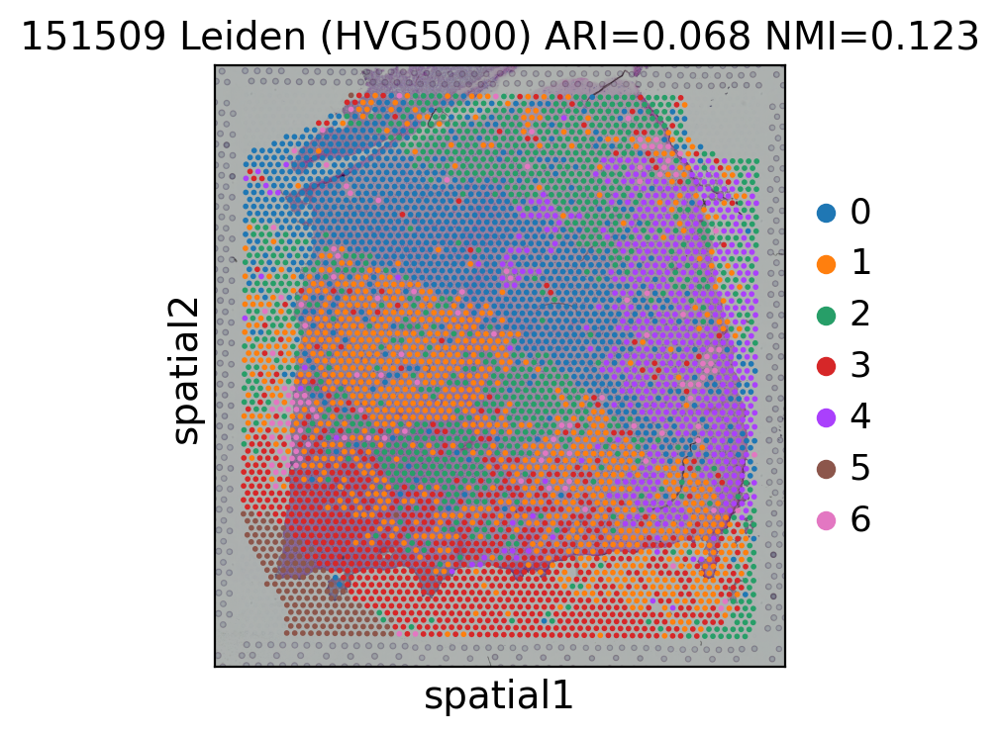

[SKIP] 151510: missing matrix file; cannot cluster.


,dataset,source_outs,ARI (PCA),NMI (PCA),ARI (Top2000),NMI (Top2000),ARI (Top5000),NMI (Top5000),note
1,151507,data/figshare_prepared_outs/151507,0.089053,0.178309,0.080575,0.141348,0.093279,0.154156,
2,151508,data/figshare_prepared_outs/151508,0.101422,0.182079,0.075402,0.124718,0.060968,0.106513,
3,151509,data/figshare_prepared_outs/151509,0.063524,0.117398,0.052480,0.103903,0.068076,0.122533,
4,151510,data/figshare_10x_visium,NaN,NaN,NaN,NaN,NaN,NaN,Missing matrix
0,151671,data/gdrive_visium,0.407887,0.508660,0.158953,0.184139,0.169988,0.241730,


In [44]:
FIGSHARE_DIR = Path("data/figshare_10x_visium")
FIG_DIR = Path("figures"); FIG_DIR.mkdir(exist_ok=True)

def matrix_path(ds):
    return FIGSHARE_DIR / f"{ds}_filtered_feature_bc_matrix.h5"

DATASET_IDS = ["151671","151507","151508","151509","151510"]

rows = []
found_map = {}
missing_reason = {}

for ds in DATASET_IDS:
    if ds == "151671":
        adata = adata_151671
        outs_dir = Path("data/gdrive_visium")
        found_map[ds] = str(outs_dir)

    else:
        if not matrix_path(ds).exists():
            # record missing
            found_map[ds] = str(FIGSHARE_DIR)
            missing_reason[ds] = f"Missing count matrix ({ds}_filtered_feature_bc_matrix.h5 not provided in Figshare listing)."
            rows.append({
                "dataset": ds,
                "source_outs": str(FIGSHARE_DIR),
                "ARI (PCA)": None, "NMI (PCA)": None,
                "ARI (Top2000)": None, "NMI (Top2000)": None,
                "ARI (Top5000)": None, "NMI (Top5000)": None,
                "note": "Missing matrix"
            })
            print(f"[SKIP] {ds}: missing matrix file; cannot cluster.")
            continue

        outs_dir = prepare_visium_outs_from_flat(ds)
        adata = read_visium_prepared(outs_dir)
        found_map[ds] = str(outs_dir)

    # Run pipelines
    ad_pca, ari_pca, nmi_pca = run_leiden_pipeline(adata, mode="pca", key_added="leiden_pca", resolution=0.8, n_pcs=30)
    save_spatial_plot(ad_pca, "leiden_pca", FIG_DIR/f"{ds}_leiden_PCA.png",
                      title=f"{ds} Leiden (PCA) ARI={ari_pca:.3f} NMI={nmi_pca:.3f}")

    ad_2k, ari_2k, nmi_2k = run_leiden_pipeline(adata, mode="hvg", n_hvg=2000, key_added="leiden_2k", resolution=0.8, n_pcs=30)
    save_spatial_plot(ad_2k, "leiden_2k", FIG_DIR/f"{ds}_leiden_HVG2000.png",
                      title=f"{ds} Leiden (HVG2000) ARI={ari_2k:.3f} NMI={nmi_2k:.3f}")

    ad_5k, ari_5k, nmi_5k = run_leiden_pipeline(adata, mode="hvg", n_hvg=5000, key_added="leiden_5k", resolution=0.8, n_pcs=30)
    save_spatial_plot(ad_5k, "leiden_5k", FIG_DIR/f"{ds}_leiden_HVG5000.png",
                      title=f"{ds} Leiden (HVG5000) ARI={ari_5k:.3f} NMI={nmi_5k:.3f}")

    rows.append({
        "dataset": ds,
        "source_outs": str(outs_dir),
        "ARI (PCA)": ari_pca, "NMI (PCA)": nmi_pca,
        "ARI (Top2000)": ari_2k, "NMI (Top2000)": nmi_2k,
        "ARI (Top5000)": ari_5k, "NMI (Top5000)": nmi_5k,
        "note": ""
    })

df = pd.DataFrame(rows).sort_values("dataset")
df

In [45]:
def read_visium_prepared(outs_dir: Path, gt_col="layer_guess_reordered"):
    outs_dir = Path(outs_dir)
    adata = sc.read_visium(str(outs_dir), count_file="filtered_feature_bc_matrix.h5", load_images=True)
    adata.var_names_make_unique()

    meta_path = outs_dir / "metadata.tsv"
    if meta_path.exists():
        meta = pd.read_csv(meta_path, sep="\t")
        if "barcode" in meta.columns:
            meta = meta.set_index("barcode")
        else:
            meta = meta.set_index(meta.columns[0])
        meta.index = meta.index.astype(str)

        # harmonize "-1"
        if meta.index.isin(adata.obs_names).sum() == 0:
            meta2 = meta.copy()
            meta2.index = meta2.index + "-1"
            if meta2.index.isin(adata.obs_names).sum() > 0:
                meta = meta2

        adata.obs = adata.obs.join(meta, how="left")
        if gt_col in adata.obs.columns:
            adata.obs[gt_col] = adata.obs[gt_col].astype("category")
            print("GT missing rate:", float(adata.obs[gt_col].isna().mean()))
    else:
        print("[WARN] metadata.tsv missing; ARI/NMI will be NaN.")

    return adata

# Save and Show

In [46]:
OUT_ROOT = Path("data"); OUT_ROOT.mkdir(exist_ok=True)
TABLE_PATH = OUT_ROOT / "task3_table.csv"
df.to_csv(TABLE_PATH, index=False)
print("Saved table:", TABLE_PATH.resolve())

display(df)

Saved table: /content/data/task3_table.csv


,dataset,source_outs,ARI (PCA),NMI (PCA),ARI (Top2000),NMI (Top2000),ARI (Top5000),NMI (Top5000),note
1,151507,data/figshare_prepared_outs/151507,0.089053,0.178309,0.080575,0.141348,0.093279,0.154156,
2,151508,data/figshare_prepared_outs/151508,0.101422,0.182079,0.075402,0.124718,0.060968,0.106513,
3,151509,data/figshare_prepared_outs/151509,0.063524,0.117398,0.052480,0.103903,0.068076,0.122533,
4,151510,data/figshare_10x_visium,NaN,NaN,NaN,NaN,NaN,NaN,Missing matrix
0,151671,data/gdrive_visium,0.407887,0.508660,0.158953,0.184139,0.169988,0.241730,
